# Diseño de software

----

### Unidad 3: Análisis estático de código

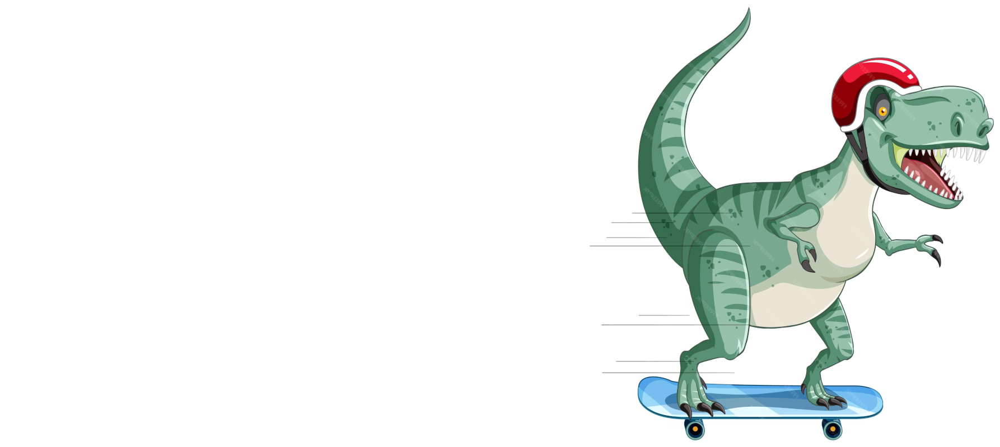 

## Códe estyle

> Se pasa más tiempo leyendo código que escribiéndolo. 
> **Readability counts** (PEP 20)

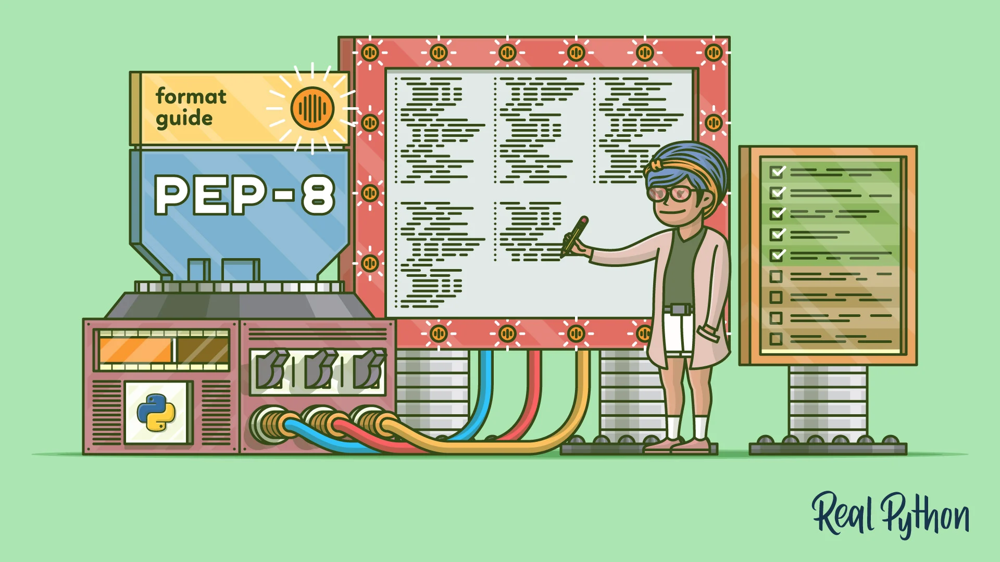

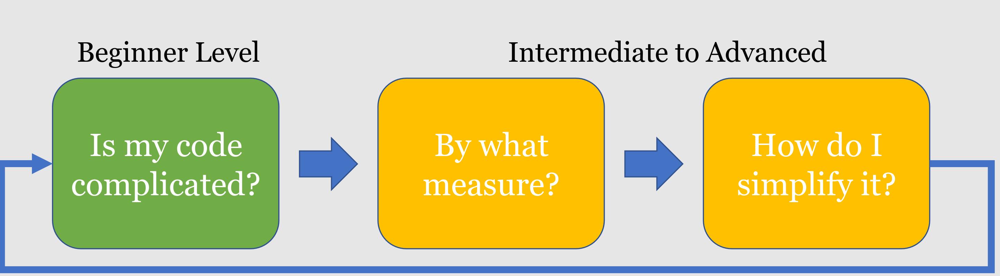

## Por que el code-style importa

> Se pasa más tiempo leyendo código que escribiéndolo. 
> **Readability counts** (PEP 20)
 
1. **Legibilidad y Mantenibilidad:** Si es más fácil de leer, es más fácil de entender y es más fácil de mantener.
2. **Colaboración:** Cualquier miembro de unl equipo puede entender el código de los demás más rápidamente.
3. **Reducción de Errores:** Es más fácil detectar problemas de lógica o sintaxis cuando el código se presenta de manera ordenada y coherente.
4. **Facilita la Depuración:** Es más fácil identificar la ubicación de los problemas en un código ordenado
5. **Adherencia a Estándares:** Mantiene la coherencia en el código y para garantizar que cumpla con las mejores prácticas de los estándares
6. **Eficiencia y Productividad:** Se reduce la necesidad de adivinar cómo funciona el código o de revisar constantemente la documentación.
7. **Estándares de la Industria:** En algunos casos, seguir un estilo de código específico es necesario para cumplir con estándares de la industria o regulaciones gubernamentales. Por ejemplo, en el desarrollo de software médico o aeroespacial, se pueden imponer reglas estrictas sobre la calidad del código y la documentación.


## Herramientas de code-style

- **PEP8:** Guía de estilo oficial de Python.
- **autopep8:** Reformatea el código Python para cumplir con PEP8 automáticamente.
- **flake8:** Verifica PEP8, errores de sintaxis y realiza análisis estático.
- **pylint:** Encuentra errores y problemas de estilo, proporciona sugerencias.
- **black:** Reformatea el código para simplicidad y consistencia.
- **isort:** Organiza las importaciones según PEP8.
- **mypy:** Verifica estáticamente los tipos de Python.
- **bandit:** Busca vulnerabilidades de seguridad y problemas de estilo.


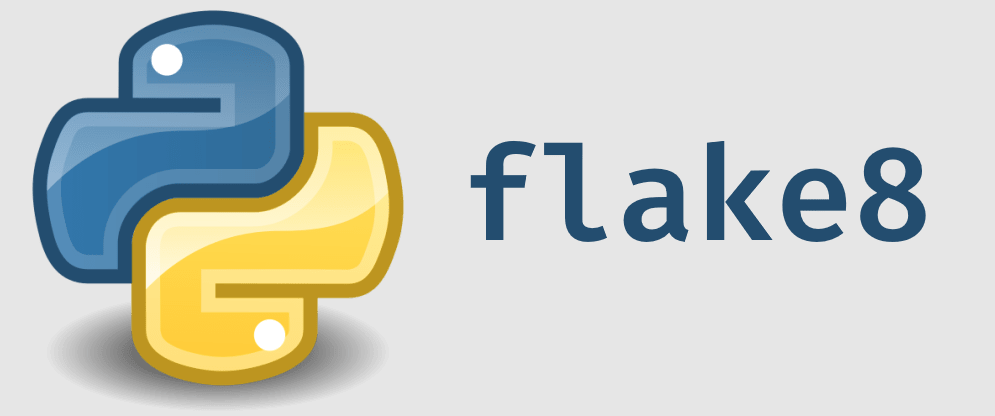


[Flake8](https://github.com/PyCQA/flake8) es un herramienta que sirve para **chequear** el estilo de código Python.
Esta diseñada sobre otras herramientas y se puede extender su funcionalidad con diversos plugins.


Para correr en la terminal tenemos estas opciones:
```
flake8
flake8 file.py
flake8 /path/to/folder/
```

## Ejemplo con flake8

In [ ]:
flake8 codes/style_example.py

El estilo que revisa no es exactamente PEP8. Hay [varios plugins](https://github.com/DmytroLitvinov/awesome-flake8-extensions) que se agregan para estilos especializados.

Por ejemplo:
   - flake8-import-order  (verifica el orden de los imports)
   - flake8-black  (menciona los cambios que haría black)
   - pep8-naming   (verifica los nombres de variables, funciones, clases, etc.)
   - flake8-builtins (prohibe el uso de funciones de python como nombres de variables)

In [ ]:
!pip install flake8-import-order pep8-naming flake8-black

In [ ]:
flake8 codes/style_example.py

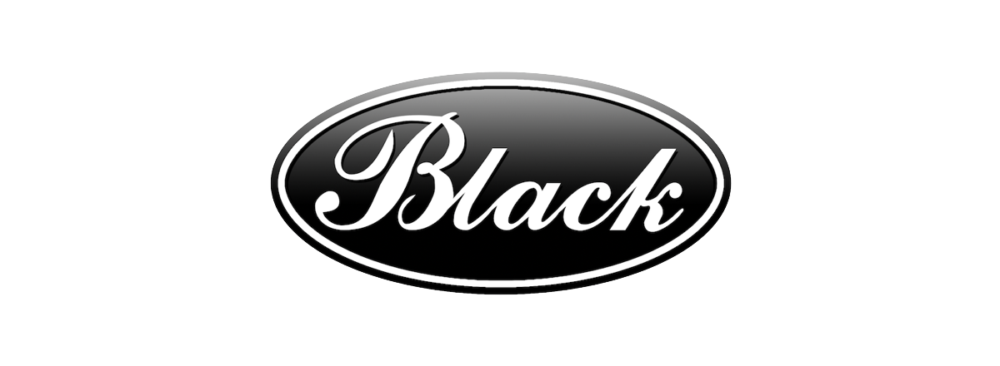

Es un **formateador** (*linter*) de codigo para apegarse al estándar PEP8. *Ojo que sobreescribe los archivos!*

Revisa que el AST sea igual antes y despues de formatear. Funciona con poca (o nula) configuración y te ahorra tener que pensar.

Tiene opciones para evitar formatear secciones de código:
   - No formatea bloques que empiecen con **# fmt: off** y terminen con **# fmt: on**.
   - No formatea líneas que terminen con **# fmt: skip**.

In [ ]:
pip install black

In [ ]:
black codes/style_example.py -l 80

## Algunas consideraciones sobre LOC

- **Physical SLOC (LOC):** Es un recuento de líneas en el texto del código fuente del programa, excluyendo comentarios. Es sensible a convenciones de estilo y formato lógicamente irrelevantes
- **Logical SLOC (LLOC):** intenta medir el número de "declaraciones" ejecutables. Esta vinculado a lenguajes específicos (una medida SLOC lógica simple para lenguajes de programación tipo `C` es el número de puntos y comas que terminan en declaraciones).

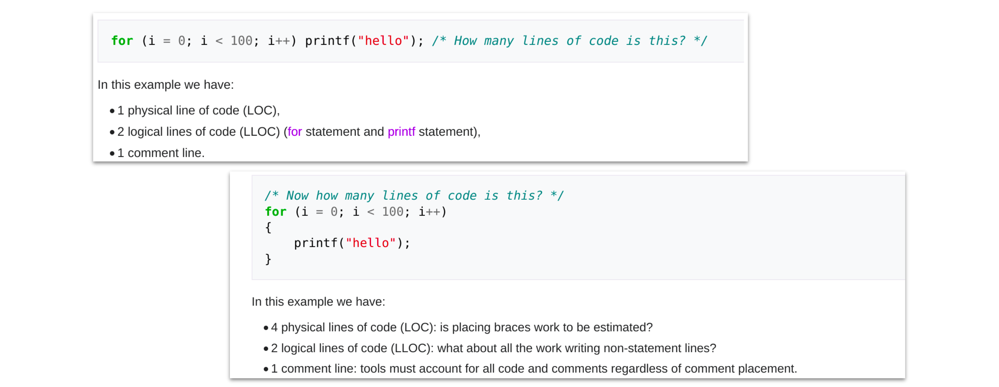



# Complejidad Ciclomática

- Métrica de ingeniería de software para medir la complejidad de un programa.
- Creada por Thomas J. McCabe en la década de 1970.
- Mayor C indica mayor complejidad del programa.
- Mayor complejidad puede dificultar el mantenimiento y la depuración del código.
- Guía para simplificar y mejorar el código.
- No necesariamente indica defectos en el programa.
- Es análisis de código estático, solo busca un límite teórico.

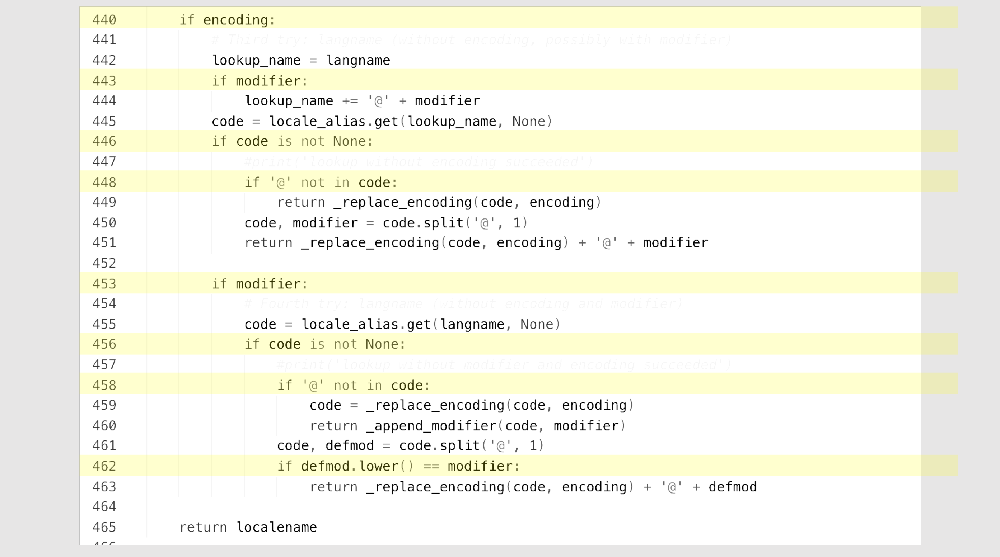

## Hay conocimiento en código complicado

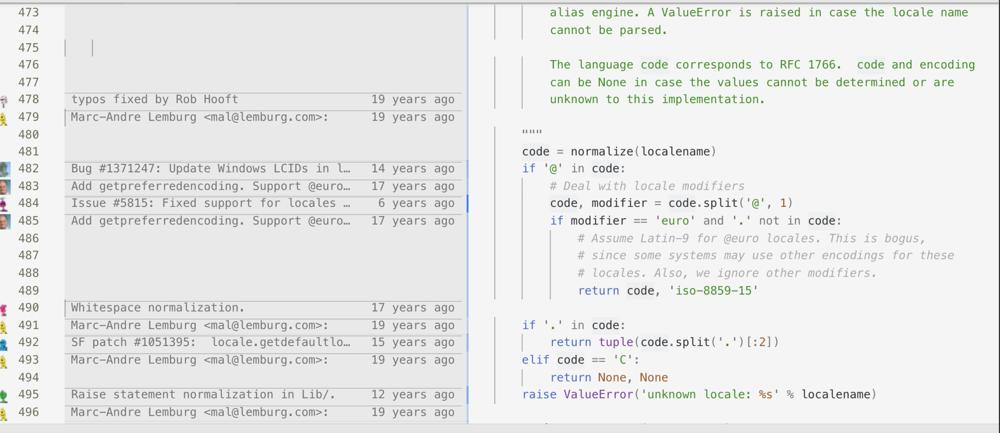

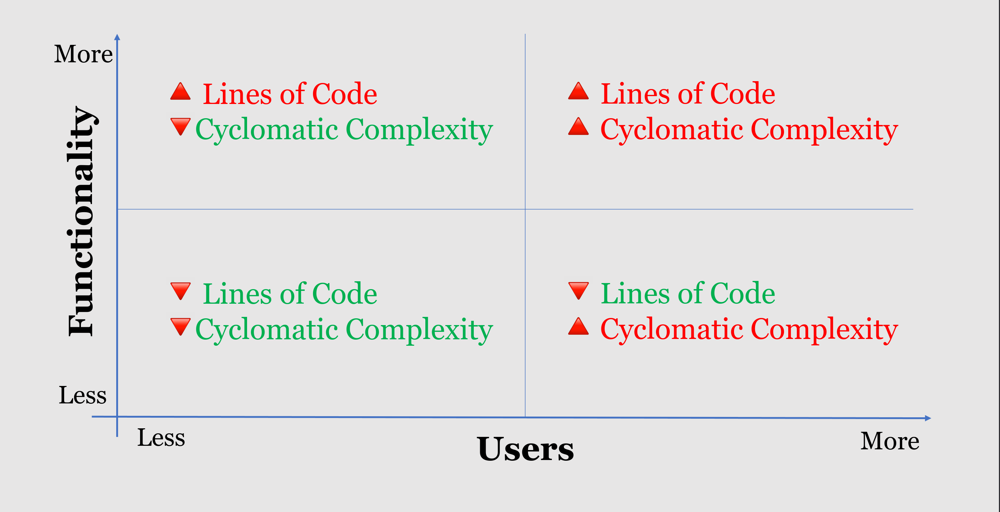

## Complejidad Ciclomática


### Cálculo

1. Crea un grafo dirigido para representar el flujo de control del programa.
2. Nodos: Puntos de decisión (bucles, condicionales, saltos).
3. Aristas: Transiciones entre nodos.
4. Aplica la fórmula: `C = E - N + 2P`.


### McCabe complexity threshold

El valor de umbral de complejidad de McCabe es un número arbitrario que se elige para un proyecto o una organización específica. En muchos casos, se establece en un valor como `10` o `15`.

Flake8 lo puede limitar

```console
$ flake8 project --max-complexity 10
```

### Críticas

Ver [Wikipedia](https://en.wikipedia.org/wiki/Cyclomatic_complexity).

## Halstead Metrics

Son alternativas a $LOC$

$$
    Operands = \sum{Values} + \sum{variables} \\
    Operators = \sum{Built in syntax}  \\
    Length~(N) = Operators + Operands  \\
    Vocabulary~(\eta) = \exists!(Operators) + \exists!(Operands)  \\
$$

## Halstead Metrics

Las métricas tienen mucho sentido si pensamos en el AST

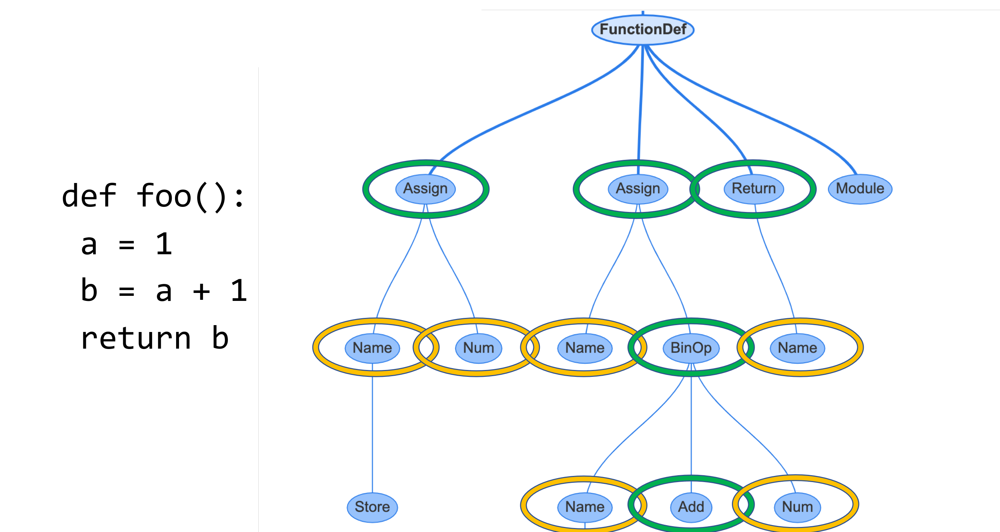

## Halstead Metrics

$$
    Operands = \sum{Values} + \sum{variables} \\
    Operators = \sum{Built in syntax}  \\
    Length~(N) = Operators + Operands  \\
    Vocabulary~(\eta) = \exists!(Operators) + \exists!(Operands)  \\
$$

$$
    Volume~(V) = N \times log_2(\eta)\\
    Difficulty~(D) = \frac{\exists!(Operators)}{2} + \frac{\exists!(Operands)}{Operands}\\
    Effort~(E) = V \times D
$$

- $V$ es mejor que $LoC$ (L)
- $D$ es un buen complemento de $CC$.

## Índice de Mantenibilidad

$$ MI = 171 - 5.2 \times ln(V) − 0.23 \times (C) - 16.2 \times ln(L) $$

Donde:

- $V$ Volumen
- $C$ Complejidad ciclomática
- $L$ Line of code

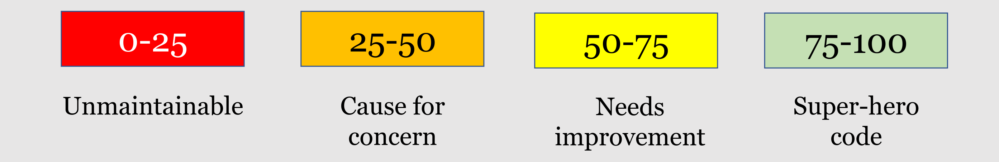

## Índice de Mantenibilidad

$$ MI = 171 - 5.2 \times ln(V) − 0.23 \times (C) - 16.2 \times ln(L) $$

- El uso de esta fórmula significaba que $MI \in [171y, \infty)$
- Microsoft en el 2011 para su herramienta VisualStudio (NO code) decide acotarla entre $[0, 100]$. [Ver](https://learn.microsoft.com/en-us/visualstudio/code-quality/code-metrics-maintainability-index-range-and-meaning?view=vs-2022)


$$ MsMI = \max\{0, \frac{MI}{171}\}$$




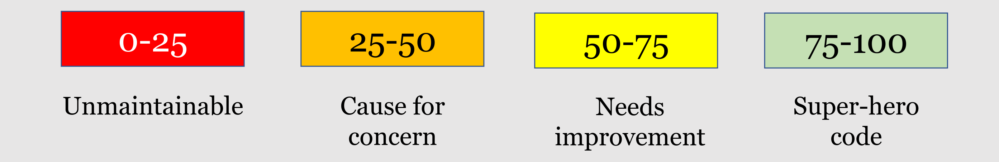

## Radon

Radon is a Python tool that computes various metrics from the source code. Radon can compute:

- McCabe's complexity, i.e. cyclomatic complexity
- raw metrics (these include SLOC, comment lines, blank lines, &c.)
- Halstead metrics (all of them)
- Maintainability Index (the one used in Visual Studio)

```console
$ pip install radon
```


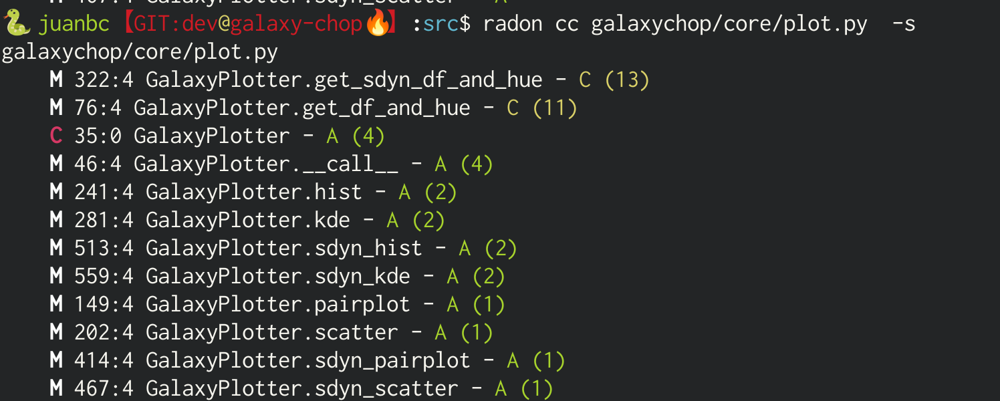

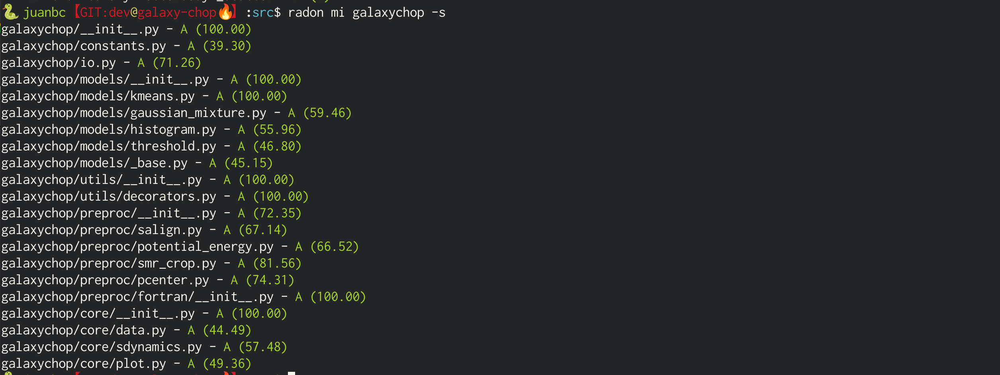

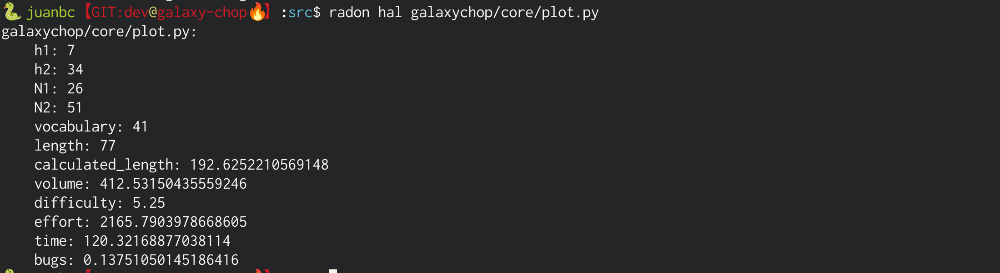

## Todo muy lindo... y ahora?

- Tenemos las métricas, que hacemos con ellas?
- Lo piola seria ver tendencias en tiempo.

## Wily 

Wily itera sobre un repositorio git e indexa la complejidad de los archivos fuente de Python utilizando varios algoritmos. 

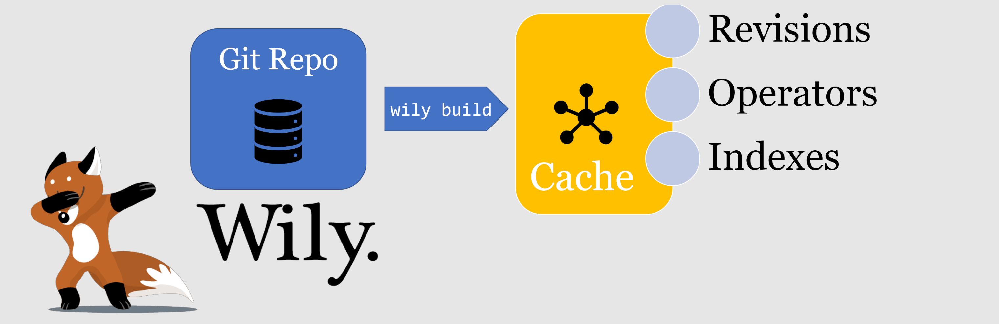

```bash
$ pip install wily
```


## Wily - Comandos Básicos

- `wily build <PATH/TO/FILE/OR/DIRECTORY>` indexa las metricas de complejidad de un archivo o directorio.
- `wily report <PATH/TO/FILE/OR>` reporta las metricas a lo largo del tiempo.
- `wily graph <PATH/TO/FILE/OR>` de ve las 

## Wily report

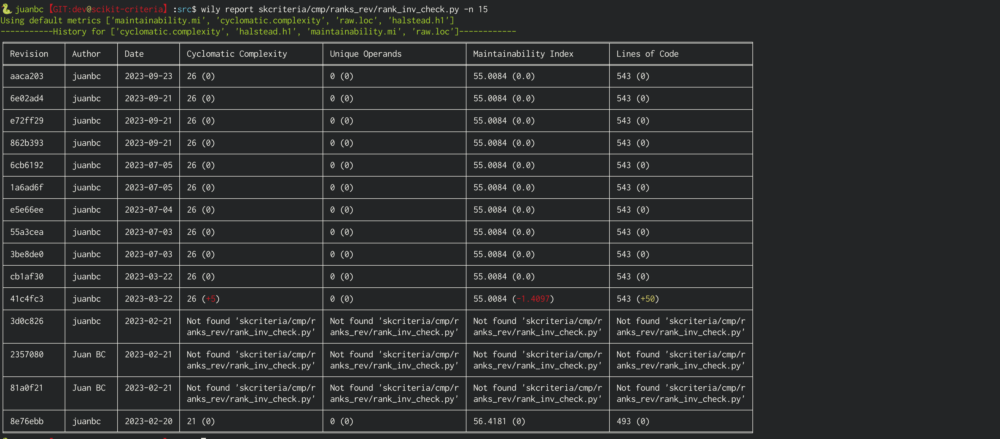

## Wily graph

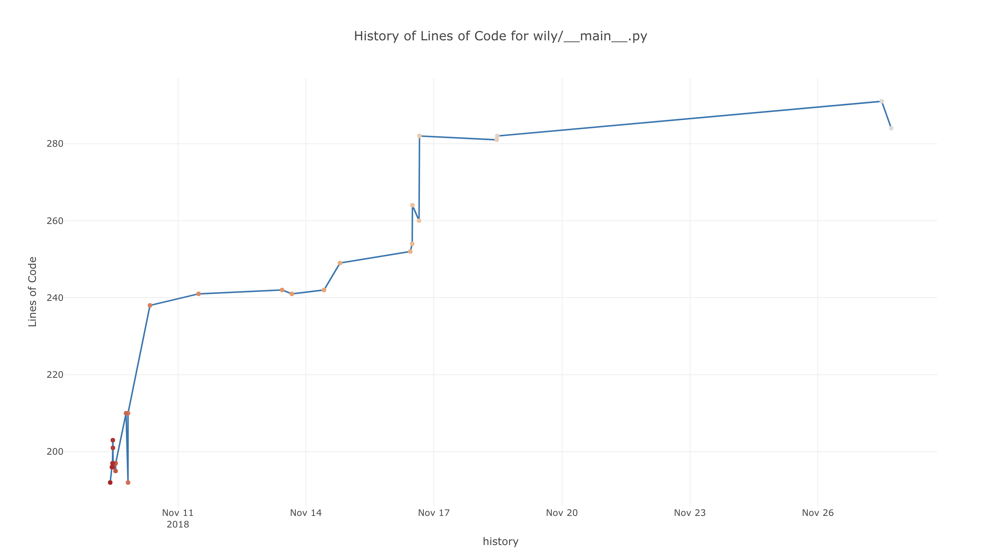

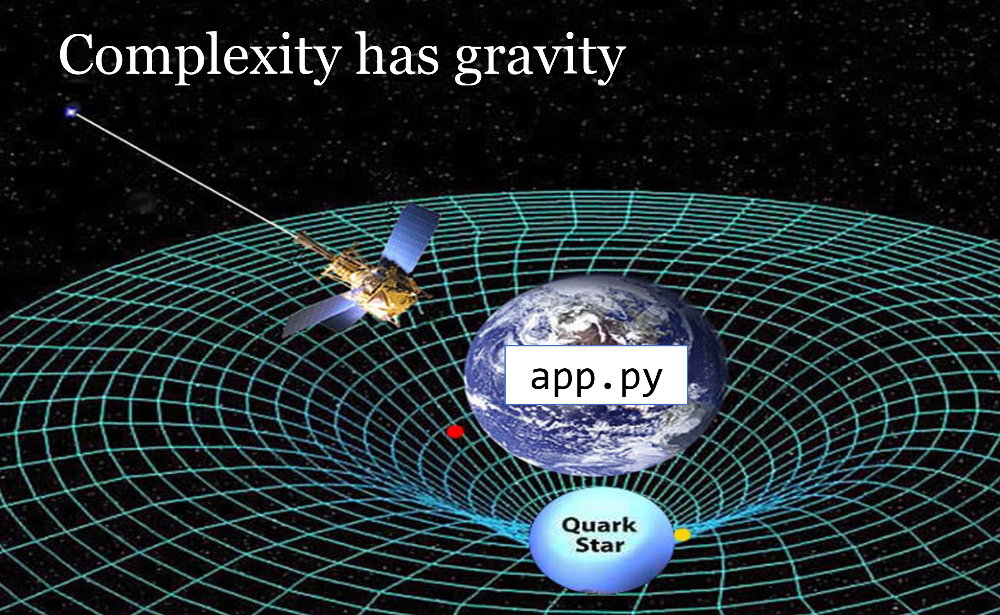

O en cristiano: si algo es complejo, tiende a volverse más complejo

## Referencias

- https://www.youtube.com/watch?v=dqdsNoApJ80
- https://wily.readthedocs.io/en/latest/